In [14]:
import anndata as ad
import os
import re
import numpy as np
import squidpy as sq
import scanpy as sc
import harmonypy as hm
import umap

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Load single-nucleus nuclear protein intensity from one brain section
folder = "cell_measurement/ave_int/"

# collect all h5ad file paths
files = [os.path.join(folder, f) for f in os.listdir(folder) if f.endswith(".h5ad")]

# read all into a list
adatas = [sc.read_h5ad(f) for f in files]

# concatenate into one AnnData
adata = ad.concat(adatas, join="outer", label="batch", keys=[os.path.basename(f) for f in files])

print(adata)

AnnData object with n_obs × n_vars = 178927 × 18
    obs: 'batch'


In [3]:
# Load center-of-mass of Cellpose masks for spatial positions

spatial_df = pd.read_csv("center_of_mass_results.csv")
spatial_df['Label'] = spatial_df['Label'].astype(str)

spatial_df = spatial_df.set_index("Label")
spatial_df = spatial_df.loc[adata.obs_names]

spatial_ar = spatial_df[["X", "Y", "Z"]].to_numpy()
adata.obsm['spatial3d']=spatial_ar
adata.obsm['spatial']=spatial_ar[:,:-1]
adata.obs['z_layer']=spatial_ar[:,-1]

In [4]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)

In [10]:
# Load nuclear protein intensity matrix from another brain section, preprocessed the same way

adata_1st_brain = ad.read_h5ad('./first_brain_measurement/ave_intensity_matrix.h5ad')

In [12]:
# make a matrix with the 16 common nuclear markers in both brains

common_vars = adata_1st_brain.var_names.intersection(adata.var_names)
adata_1 = adata_1st_brain[:, common_vars].copy()
adata_2 = adata[:, common_vars].copy()

In [14]:
adata_both = ad.concat([adata_1, adata_2],
                      join="outer",     # keep all features
                      label="dataset",  # new column in .obs
                      keys=["1st_brain", "2nd_brain"])  

C:\Users\liany\AppData\Local\anaconda3\Lib\site-packages\anndata\_core\anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [16]:
adata_both

AnnData object with n_obs × n_vars = 373817 × 15
    obs: 'cluster', 'leiden', 'batch', 'z_layer', 'dataset'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial3d'
    layers: 'counts'

In [18]:
common_genes = adata_1.var_names.intersection(adata_2.var_names)
len(common_genes)

15

## Make integrated UMAP of two brain sections using Harmony

In [20]:
adata_both.layers["counts"] = adata_both.X.copy()
sc.pp.normalize_total(adata_both, inplace=True)
sc.pp.log1p(adata_both)

In [22]:
sc.tl.pca(adata_both, svd_solver="arpack")

In [24]:
ho = hm.run_harmony(adata_both.obsm['X_pca'], adata_both.obs, 'dataset', theta=6, lamb = 0.3, sigma = 0.02, nclust=100, max_iter_harmony = 20, random_state=42)   # 
# theta (diversity penalty) Default: 2 Larger values (e.g. 6, 8, 12) force Harmony to align datasets more strongly, discouraging dataset-specific structure.
# Larger (e.g. 50–100 for complex data): better representation of local structure, often making datasets spread more evenly.

# save Harmony-corrected embeddings
adata_both.obsm['X_pca_harmony'] = ho.Z_corr.T

2025-12-01 17:26:10,445 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-12-01 17:26:38,538 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-12-01 17:26:40,581 - harmonypy - INFO - Iteration 1 of 20
2025-12-01 17:29:16,181 - harmonypy - INFO - Iteration 2 of 20
2025-12-01 17:31:52,075 - harmonypy - INFO - Iteration 3 of 20
2025-12-01 17:34:27,185 - harmonypy - INFO - Iteration 4 of 20
2025-12-01 17:37:02,709 - harmonypy - INFO - Iteration 5 of 20
2025-12-01 17:39:38,075 - harmonypy - INFO - Iteration 6 of 20
2025-12-01 17:42:13,670 - harmonypy - INFO - Iteration 7 of 20
2025-12-01 17:44:48,851 - harmonypy - INFO - Iteration 8 of 20
2025-12-01 17:47:24,576 - harmonypy - INFO - Iteration 9 of 20
2025-12-01 17:50:00,337 - harmonypy - INFO - Iteration 10 of 20
2025-12-01 17:52:35,797 - harmonypy - INFO - Iteration 11 of 20
2025-12-01 17:55:10,758 - harmonypy - INFO - Iteration 12 of 20
2025-12-01 17:57:38,773 - harmonypy - INFO - Iteration 13 of

In [25]:
X_pca_1 = adata_both[adata_both.obs["dataset"]=="1st_brain"].obsm["X_pca_harmony"]
X_pca_2 = adata_both[adata_both.obs["dataset"]=="2nd_brain"].obsm["X_pca_harmony"]

In [26]:

reducer = umap.UMAP(n_neighbors=5, min_dist=0, n_components=2, random_state=42)
reducer.fit(X_pca_1)
X_umap_1 = reducer.transform(X_pca_1)
X_umap_2 = reducer.transform(X_pca_2)

C:\Users\liany\AppData\Local\anaconda3\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [44]:
# adata_both.write('harmony_2_brins_onto_1st.h5ad')   

C:\Users\liany\AppData\Local\anaconda3\Lib\site-packages\anndata\_core\anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


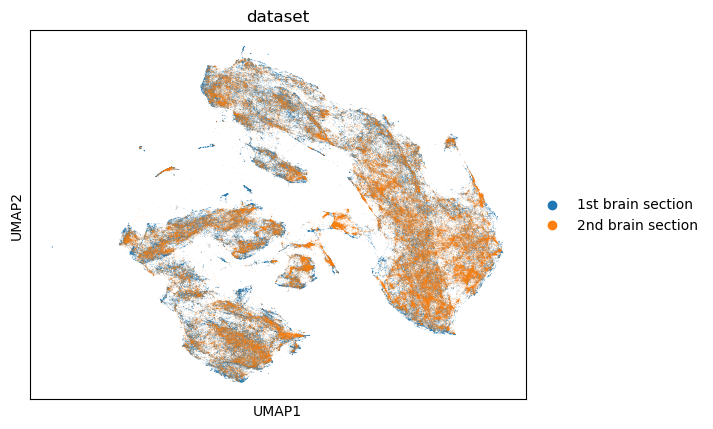

In [34]:
adata_1.obsm["X_umap"] = X_umap_1
adata_2.obsm["X_umap"] = X_umap_2

adata_plot = ad.concat(
    [adata_1, adata_2],
    join="outer",
    label="dataset",
    keys=["1st brain section", "2nd brain section"],
    merge="unique"
)

adata_plot.obsm['X_pca_harmony'] = np.vstack([X_pca_1, X_pca_2])
adata_plot.obsm["X_umap"] = np.vstack([X_umap_1, X_umap_2])

# 7) Plot
sc.pl.umap(adata_plot, color=["dataset"])

In [36]:
adata_plot

AnnData object with n_obs × n_vars = 373817 × 15
    obs: 'cluster', 'leiden', 'batch', 'z_layer', 'dataset'
    uns: 'dataset_colors'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial3d', 'X_pca_harmony'
    varm: 'PCs'
    layers: 'counts'

In [46]:
# Save matrix for downstream analysis

# adata_plot.write('adata_plot_harmony_ave_int_2_brains.h5ad')   

In [70]:
# adata_plot= ad.read('adata_plot_harmony_ave_int_2_brains.h5ad')

In [86]:
if 'leiden' in adata_plot.obs:
    adata_plot.obs.drop(columns=['leiden'], inplace=True)

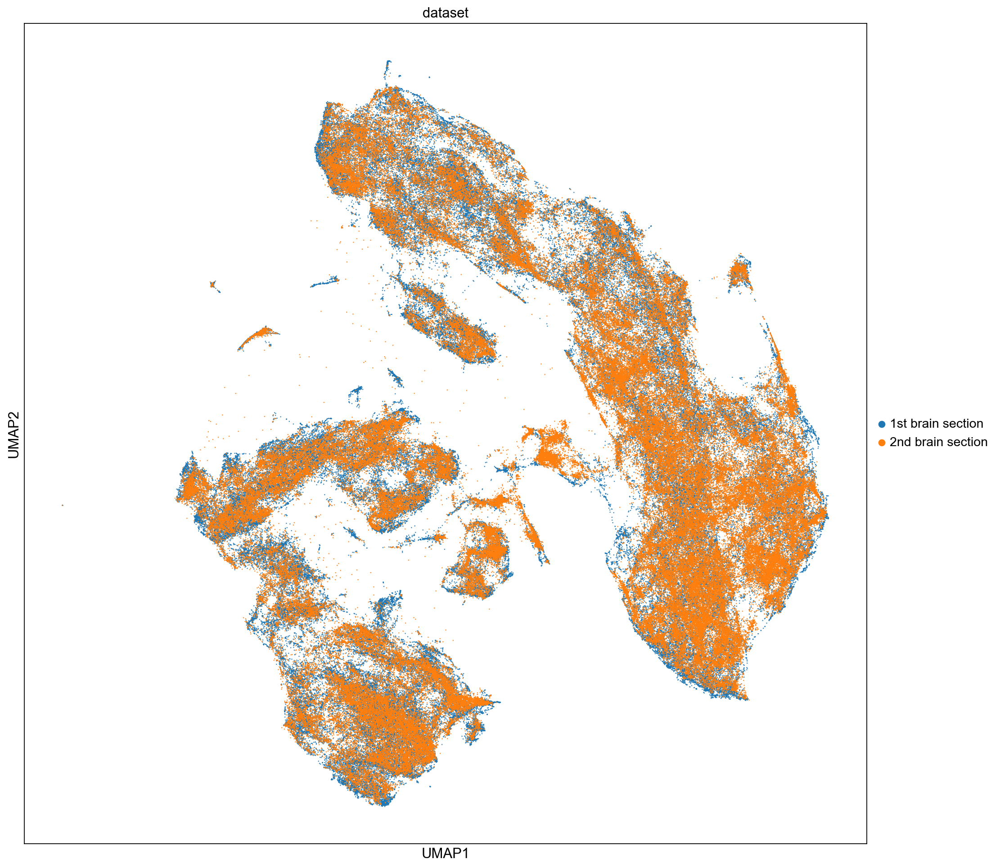

In [41]:
sc.set_figure_params(figsize=(15, 15))
sc.pl.umap(adata_plot, color=["dataset"], size=5, alpha=0.9)

# plt.savefig("harmony_umap.eps", format="eps", bbox_inches="tight")
plt.close()

In [43]:
sc.set_figure_params(figsize=(15, 15))

ax = sc.pl.umap(
    adata_plot,
    color=["dataset"],
    size=5,
    alpha=0.9,
    show=False
)

# Rasterize only the scatter points
for coll in ax.collections:
    coll.set_rasterized(True)

# plt.savefig("harmony_umap2.pdf", format="pdf", dpi=300, bbox_inches="tight")
plt.close()

In [43]:
print("neighbors")
sc.pp.neighbors(adata_plot, n_neighbors=10, random_state=42, use_rep='X_pca_harmony')

neighbors


In [44]:
adata_plot

AnnData object with n_obs × n_vars = 373817 × 15
    obs: 'cluster', 'leiden', 'batch', 'z_layer', 'dataset'
    uns: 'dataset_colors', 'neighbors'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial3d', 'X_pca_harmony'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [45]:
print("Leiden")
resolution = 0.8       # 1 -- 40 clusters
sc.tl.leiden(adata_plot, resolution=resolution, random_state=38)

Leiden


C:\Users\liany\AppData\Local\Temp\ipykernel_60156\2570543703.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_plot, resolution=resolution, random_state=38)


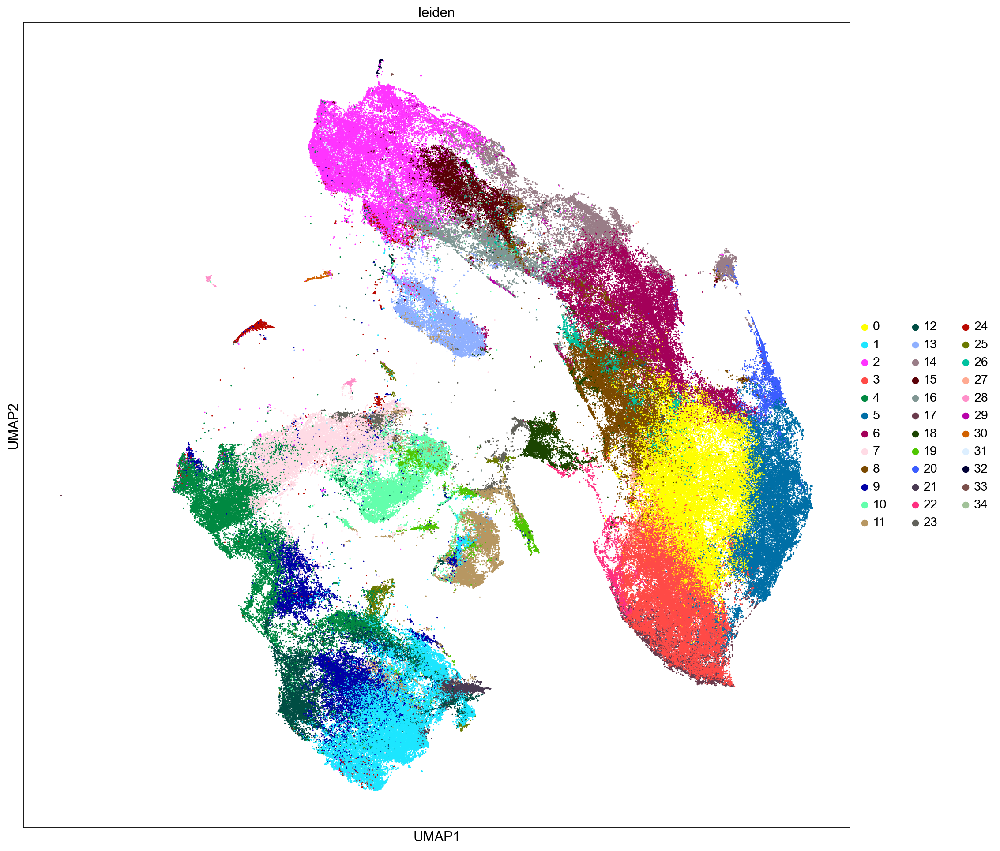

In [46]:
sc.set_figure_params(figsize=(15, 15))
sc.pl.umap(adata_plot, color=["leiden"], size=8)

In [47]:
ad_1st = adata_plot[adata_plot.obs.dataset == '1st brain section']
ad_2nd = adata_plot[adata_plot.obs.dataset == '2nd brain section']

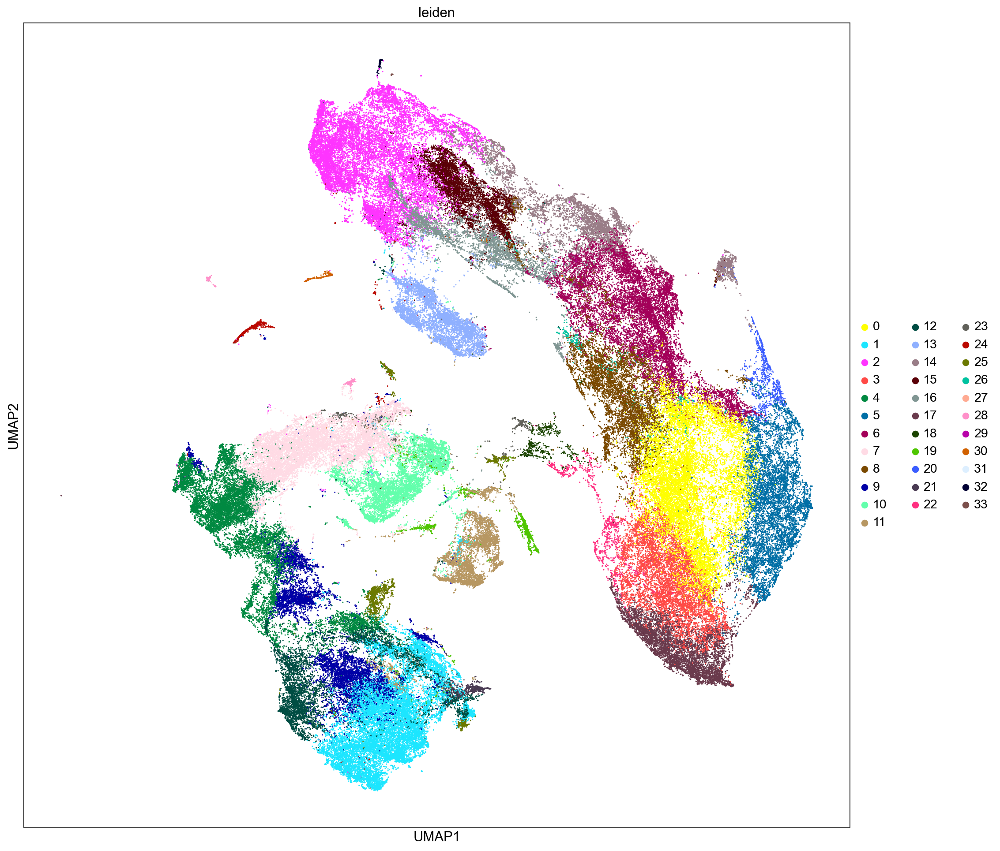

In [48]:
sc.pl.umap(ad_1st, color=["leiden"],size=7)

In [27]:
# UMAP and clustering are random each time. Save clustering results.

adata_plot.write('harmony_ave_int_2_brains.h5ad')   
ad_1st.write('harmony_ave_int_Brain_1.h5ad')

In [6]:
# Load another random clustering result shown in paper

ad_1st = ad.read_h5ad('harmony_ave_int_Brain_1.h5ad') 

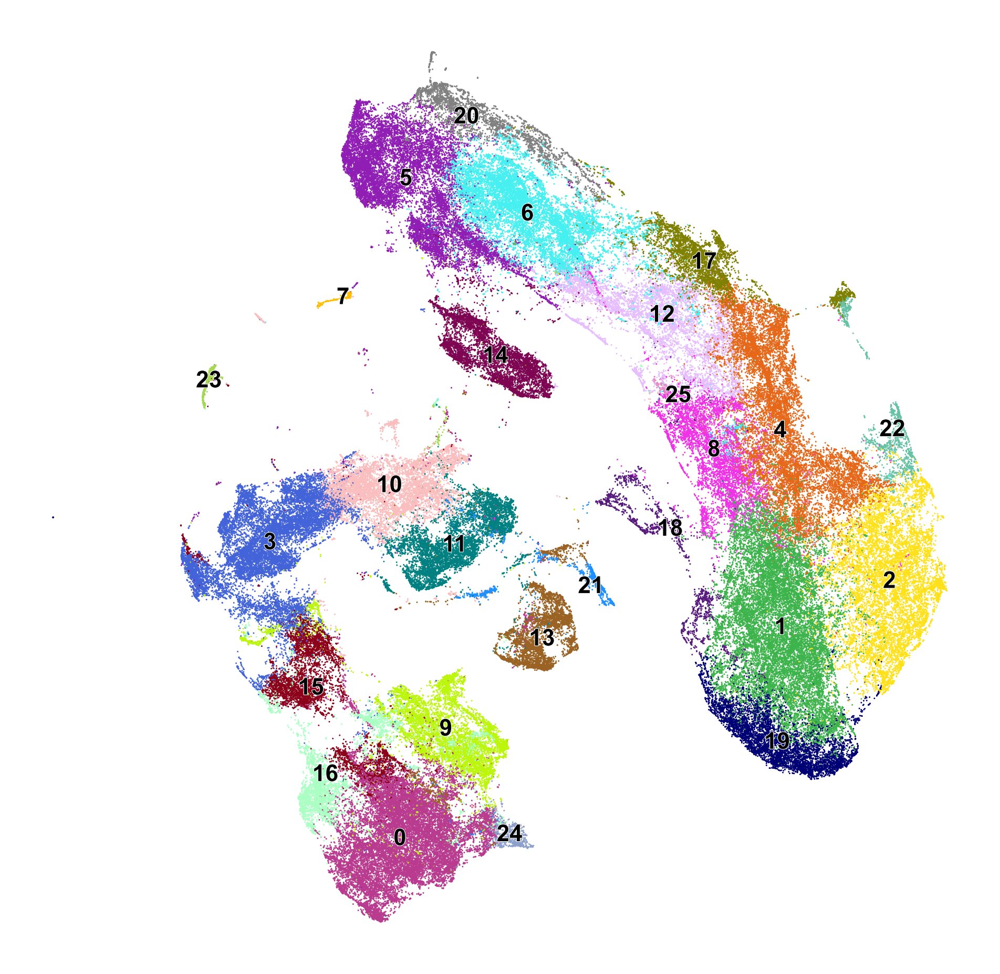

In [85]:
import matplotlib.patheffects as PathEffects

sc.set_figure_params(figsize=(15, 15))

# Plot UMAP with on-data labels
sc.pl.umap(ad_1st, color="leiden", legend_loc="on data", size=7, show=False)

ax = plt.gca()

ax.set_frame_on(False)   # removes the box
ax.set_xticks([])        # removes x ticks
ax.set_yticks([])        # removes y ticks
ax.set_xlabel("")        # removes x-axis title
ax.set_ylabel("")        # removes y-axis title
ax.set_title("")  

for txt in ax.texts:
    txt.set_fontsize(20)
    txt.set_fontname("Arial")
    txt.set_path_effects([
        PathEffects.withStroke(linewidth=1, foreground='white')  # white outline
    ])

for coll in ax.collections:
    coll.set_rasterized(True)

# plt.savefig("umap_2_brains.pdf", dpi=300, bbox_inches="tight", pad_inches=0)
plt.show()

In [18]:
# rotate spatial coordinates for plotting the brain section

# 1. Backup original coordinates
original_coords = ad_1st.obsm["spatial"].copy()

# 2. Rotate coordinates
theta = np.radians(-137)
rotation_matrix = np.array([
    [np.cos(theta), -np.sin(theta)],
    [np.sin(theta),  np.cos(theta)]
])
rotated_coords = original_coords @ rotation_matrix.T
ad_1st.obsm["spatial_rotated"] = rotated_coords

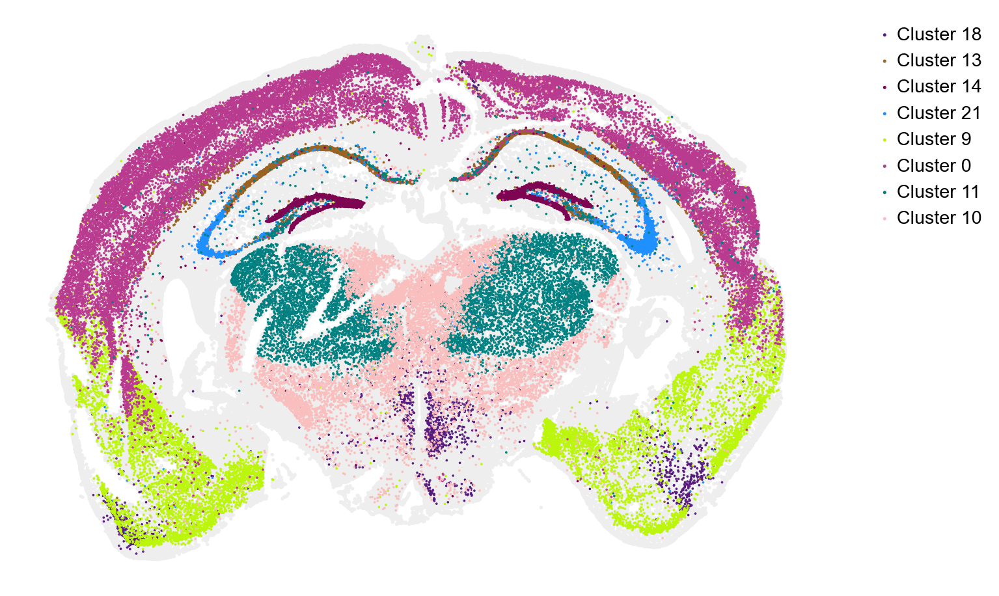

In [87]:
coords = ad_1st.obsm['spatial_rotated']
selected_clusters = ['18', '13', '14', '21', '9','0', '11', '10', ]     

# Ensure Leiden categories and colors
leiden_categories = ad_1st.obs['leiden'].cat.categories
leiden_colors = ad_1st.uns['leiden_colors']
cluster_colors = dict(zip(leiden_categories, leiden_colors))

bg_color = "#EEEEEE"

# Output folder
output_dir = "./plots"
os.makedirs(output_dir, exist_ok=True)
save_path = os.path.join(output_dir, "Glut_clusters.pdf")

# Create figure
plt.figure(figsize=(10, 10))

# Background
plt.scatter(coords[:, 0], coords[:, 1],
            c=[bg_color]*coords.shape[0], s=6, edgecolors='none', rasterized=True)

# Overlay clusters
for cluster in selected_clusters:
    mask = ad_1st.obs['leiden'] == cluster
    plt.scatter(coords[mask, 0], coords[mask, 1],
                c=[cluster_colors[cluster]]*np.sum(mask),
                s=0.4, label=f"Cluster {cluster}", rasterized=True)

plt.gca().set_aspect('equal')
plt.gca().invert_yaxis()
plt.axis('off')

# Legend on the right without box
plt.legend(markerscale=2, bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

plt.show()

## RNA feature of clusters generated using nuclear protein intensity

In [93]:
# Load single-cell RNA cycleHCR data from RNA spot-to-cell assignment

rna_df = pd.read_csv("./first_brain_measurement/cell_by_transcript_gene_name_matrix2.csv", index_col=0)

In [94]:
# Match cell IDs
rna_df.index = rna_df.index.astype(str).str.strip()
common_cells = ad_1st.obs_names.intersection(rna_df.index)
rna_df = rna_df.loc[common_cells]
adata_rna = ad.AnnData(
    X=rna_df.to_numpy(),
    obs=ad_1st.obs.loc[common_cells].copy(),
    var=pd.DataFrame(index=rna_df.columns.astype(str))
)
adata_rna.obs_names = common_cells
adata_rna.var_names = rna_df.columns.astype(str)

for key in ad_1st.obsm.keys():
    adata_rna.obsm[key] = ad_1st.obsm[key][ad_1st.obs_names.get_indexer(common_cells)]

adata_rna.uns = ad_1st.uns.copy()

In [97]:
adata_rna

AnnData object with n_obs × n_vars = 193480 × 79
    obs: 'cluster', 'leiden', 'batch', 'z_layer', 'dataset'
    uns: 'dataset_colors', 'leiden', 'leiden_colors', 'neighbors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'spatial', 'spatial3d', 'spatial_rotated'

In [99]:
sc.pp.normalize_total(adata_rna, inplace=True)
sc.pp.log1p(adata_rna)

In [101]:
import warnings
warnings.filterwarnings("ignore")
sc.tl.rank_genes_groups(adata_rna, groupby="leiden", method="wilcoxon")

In [102]:
result = adata_rna.uns['rank_genes_groups']
groups = result['names'].dtype.names

dat = pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in groups for key in ['names', 'logfoldchanges','scores','pvals']})
# dat.to_csv("harmony_ave_int_cluster_genes.csv")

In [105]:
sc.pl.rank_genes_groups(adata_rna, n_genes=15, fontsize=40)

In [107]:
# construct high variation gene list for plotting

from scipy.cluster.hierarchy import linkage, leaves_list
from scipy.spatial.distance import pdist

import warnings
warnings.simplefilter("ignore", category=pd.errors.PerformanceWarning)

# Convert 'leiden' to categorical if not already
adata_rna.obs['leiden'] = adata_rna.obs['leiden'].astype('category')

# remove small clusters with few cells if needed
keep_clusters = [str(i) for i in range(30)]
adata_filtered2 = adata_rna[adata_rna.obs['leiden'].isin(keep_clusters)].copy()

# Remove unused categories
adata_filtered2.obs['leiden'] = adata_filtered2.obs['leiden'].cat.remove_unused_categories()

sc.tl.rank_genes_groups(adata_filtered2, groupby="leiden", method="t-test")  # or 'wilcoxon'
marker_df2 = sc.get.rank_genes_groups_df(adata_filtered2, group=None)

In [108]:
marker_genes_per_cluster = {}
marker_genes_per_cluster_filtered = {}

n_genes = 10           # only keep top number of genes with highest log fold change for each cluster

for cluster in marker_df2['group'].unique():
    cluster_df = marker_df2[marker_df2['group'] == cluster]
    
    # Only keep genes with logfoldchange > 0.6 for that cluster
    cluster_df = cluster_df[cluster_df['logfoldchanges'] > 0.6]

    # Take up to n_genes
    top_genes = cluster_df['names'].head(n_genes).tolist()
    
    marker_genes_per_cluster_filtered[cluster] = top_genes

# Non-repeating gene list
used_genes = set()
unique_marker_genes_filtered = {}
for cluster, gene_list in marker_genes_per_cluster_filtered.items():
    unique_genes = []
    for gene in gene_list:
        if gene not in used_genes:
            unique_genes.append(gene)
            used_genes.add(gene)
    unique_marker_genes_filtered[cluster] = unique_genes

# Flatten for plotting/export
unique_genes_to_plot = [gene for genes in unique_marker_genes_filtered.values() for gene in genes]

# Optional: print or make DataFrame
print("Unique marker genes:")
for cluster, genes in unique_marker_genes_filtered.items():
        print(f"  Cluster {cluster}: {genes}")

Unique marker genes:
  Cluster 0: ["'Slc17a7'", "'Ngef'", "'Bsn'", "'Rbfox3'", "'Sv2b'", "'Celsr2'", "'Cadps'", "'Fos'", "'Satb2'", "'Homer1'"]
  Cluster 1: ["'Lef1'"]
  Cluster 2: ["'Sox10'", "'Mbp'", "'Olig2'", "'Pecam1'", "'Foxp2'", "'Ttr'", "'Mki67'"]
  Cluster 3: ["'Slc32a1'", "'Gad2'", "'Gad1'", "'Chat'", "'Slc6a3'", "'Ddc'", "'Slc17a8'", "'Aldh1a1'", "'Gabbr2'", "'Phox2b'"]
  Cluster 4: []
  Cluster 5: ["'Slc1a3'", "'Slc1a2'", "'Sox9'"]
  Cluster 6: ["'Ndrg2'"]
  Cluster 8: []
  Cluster 9: ["'Tiam1'", "'Cnr1'", "'Wfs1'", "'Calb2'"]
  Cluster 10: ["'Slc17a6'", "'Tcf7l2'", "'Prox1'"]
  Cluster 11: ["'Nefh'", "'Nefm'", "'Rorb'", "'Strip2'"]
  Cluster 12: []
  Cluster 13: ["'Neurod6'", "'Dlg4'", "'Bcl11b'"]
  Cluster 14: ["'Dgat2'", "'Ank3'"]
  Cluster 15: []
  Cluster 16: []
  Cluster 17: ["'Aif1'"]
  Cluster 18: []
  Cluster 19: ["'Vim'"]
  Cluster 20: ["'Ccdc153'", "'Hdc'", "'Cdh1'", "'Sspo'"]
  Cluster 21: ["'Cpe'"]
  Cluster 22: []
  Cluster 24: []
  Cluster 25: []
  Cluster 23

In [121]:
# Reorder the gene-cluster matrix by grouping similar expression patterns

# Compute expression matrix for clustering
cluster_ids = adata_filtered2.obs['leiden'].cat.categories
gene_list = [gene for genes in unique_marker_genes_filtered.values() for gene in genes]

expr_matrix = []
for cluster in cluster_ids:
    cells = adata_filtered2[adata_filtered2.obs['leiden'] == cluster]
    mean_expr = cells[:, gene_list].X.mean(axis=0).flatten()
    expr_matrix.append(mean_expr)

expr_df = pd.DataFrame(expr_matrix, index=cluster_ids, columns=gene_list)

# Cluster clusters by gene expression
linkage_matrix = linkage(pdist(expr_df, metric='euclidean'), method='average')
ordered_clusters = expr_df.index[leaves_list(linkage_matrix)].tolist()

# Reorder cluster categories
adata_filtered2.obs['leiden'] = adata_filtered2.obs['leiden'].cat.reorder_categories(ordered_clusters)


unique_genes_to_plot = []
used_genes = set()

for cluster in ordered_clusters:
    cluster_genes = unique_marker_genes_filtered.get(cluster, [])
    for gene in cluster_genes:
        if gene not in used_genes:
            unique_genes_to_plot.append(gene)
            used_genes.add(gene)

var_names = {
    f"{cluster}": unique_marker_genes_filtered[cluster]
    for cluster in ordered_clusters
    if cluster in unique_marker_genes_filtered
}


In [113]:
total_genes = sum(len(genes) for genes in var_names.values())
print(f"Total number of genes in plot: {total_genes}")

Total number of genes in plot: 55


## Export to plot in R

In [123]:
# List of marker genes 
genes_to_plot = unique_genes_to_plot

# Get cluster categories
clusters = adata_filtered2.obs['leiden'].cat.categories

# Compute mean expression per cluster
expr_matrix = []
for clust in clusters:
    cells = adata_filtered2[adata_filtered2.obs['leiden'] == clust]
    mean_expr = cells[:, genes_to_plot].X.mean(axis=0).flatten()
    expr_matrix.append(mean_expr)

expr_df = pd.DataFrame(expr_matrix, index=clusters, columns=genes_to_plot)

# Export expression matrix
# expr_df.to_csv("R_expression_matrix.csv")

In [119]:
#  export z-score matrix

from scipy.stats import zscore     
expr_zscore = expr_df.apply(zscore, axis=0)
expr_zscore.to_csv("R_expression_zscore.csv")

## Export nuclear protein intensities of each cluster to plot in R

In [10]:
# read nuclear protein intensity matrix
proteins_to_plot = ad_1st.var_names

# Get cluster categories
clusters = ad_1st.obs['leiden'].cat.categories

# Compute mean expression per cluster
expr_matrix = []
for clust in clusters:
    cells = ad_1st[ad_1st.obs['leiden'] == clust]
    mean_expr = cells[:, proteins_to_plot].X.mean(axis=0).flatten()
    expr_matrix.append(mean_expr)

expr_df = pd.DataFrame(expr_matrix, index=clusters, columns=proteins_to_plot)

# Save
# expr_df.to_csv("R_nuclear_protein_matrix.csv")

In [12]:
# Save z-scores

from scipy.stats import zscore
expr_zscore = expr_df.apply(zscore, axis=0)
expr_zscore.to_csv("R_nuclear_protein_zscore_test.csv")